# <center>**License plate detection and recognition**</center>

### **Introduction**

In this part of the project, we decided to start detecting car license from an image and extracting license numbers from it.

### **Outline**

1.   **Importing Libraries**

2.   **Importing Data**

3.   **Modeling**

In [3]:
import pandas as pd
from pathlib import Path
import json
from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects
import matplotlib.pyplot as plt

import scipy.io as sio
import glob
from zipfile import ZipFile
import os
import shutil
import fnmatch
from PIL import Image
from google.colab.patches import cv2_imshow
import cv2

In [77]:
# using drive to extract the data
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
os.mkdir("/content/data")

In [6]:
os.chdir("/content/drive/MyDrive/Cars_dataset/License_plate")

In [7]:
! ls

'archive (3).zip'   training		       yolov5_LP.zip
 classes.txt	    yolov5_license_plate.zip


In [8]:
! unzip 'archive (3).zip' -d '/content/data'

Archive:  archive (3).zip
  inflating: /content/data/dataset/test/0.jpg  
  inflating: /content/data/dataset/test/0.xml  
  inflating: /content/data/dataset/test/1.jpg  
  inflating: /content/data/dataset/test/1.xml  
  inflating: /content/data/dataset/test/10.jpg  
  inflating: /content/data/dataset/test/10.xml  
  inflating: /content/data/dataset/test/100.jpg  
  inflating: /content/data/dataset/test/100.xml  
  inflating: /content/data/dataset/test/101.jpg  
  inflating: /content/data/dataset/test/101.xml  
  inflating: /content/data/dataset/test/102.jpg  
  inflating: /content/data/dataset/test/102.xml  
  inflating: /content/data/dataset/test/103.jpg  
  inflating: /content/data/dataset/test/103.xml  
  inflating: /content/data/dataset/test/104.jpg  
  inflating: /content/data/dataset/test/104.xml  
  inflating: /content/data/dataset/test/105.jpg  
  inflating: /content/data/dataset/test/105.xml  
  inflating: /content/data/dataset/test/106.jpg  
  inflating: /content/data/dataset

In [9]:
def show_nb_files(dir):
  list = os.listdir(dir)
  number_files = len(list)
  print("Number of files :",number_files)

In [10]:
def show_files_extensions(dir):
  SplitTypes=[]
  for file in os.listdir(dir):
    SplitTypes.append(file.split('.')[-1])
  print("Files extensions :",set(SplitTypes))

Training set :

In [11]:
show_nb_files("/content/data/dataset/train")
show_files_extensions("/content/data/dataset/train")

Number of files : 1134
Files extensions : {'xml', 'jpg'}


Testing set :

In [12]:
show_nb_files("/content/data/dataset/test")
show_files_extensions("/content/data/dataset/test")

Number of files : 284
Files extensions : {'xml', 'jpg'}


Now, we want to convert our xml files to yolo format in order to start modeling.

In [13]:
os.mkdir("/content/converted_data")
os.mkdir("/content/converted_data/train")
os.mkdir("/content/converted_data/test")
os.mkdir("/content/converted_data/train/annotations")
os.mkdir("/content/converted_data/train/images")
os.mkdir("/content/converted_data/test/annotations")
os.mkdir("/content/converted_data/test/images")

In [14]:
def copyfiles(srcdir, dstdir, filepattern):
    def failed(exc):
        raise exc

    for dirpath, dirs, files in os.walk(srcdir, topdown=True, onerror=failed):
        for file in fnmatch.filter(files, filepattern):
            shutil.copy2(os.path.join(dirpath, file), dstdir)
        break # no recursion

In [15]:
copyfiles("/content/data/dataset/train", "/content/converted_data/train/annotations", "*.xml")

In [16]:
show_nb_files("/content/converted_data/train/annotations")

Number of files : 567


In [17]:
copyfiles("/content/data/dataset/train", "/content/converted_data/train/images", "*.jpg")

In [18]:
show_nb_files("/content/converted_data/train/images")

Number of files : 567


In [19]:
copyfiles("/content/data/dataset/test", "/content/converted_data/test/annotations", "*.xml")

In [20]:
show_nb_files("/content/converted_data/test/annotations")

Number of files : 142


In [21]:
copyfiles("/content/data/dataset/test", "/content/converted_data/test/images", "*.jpg")

In [22]:
show_nb_files("/content/converted_data/test/images")

Number of files : 142


In [23]:
! pip install seedir

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 114 kB 18.1 MB/s 
     |████████████████████████████████| 197 kB 46.6 MB/s 
  Created wheel for emoji: filename=emoji-2.0.0-py3-none-any.whl size=193022 sha256=bad45bffa33623cb1594126bad4b5ac42aeecb70c526c2d20d832ef86d5cd86b
  Stored in directory: /root/.cache/pip/wheels/ec/29/4d/3cfe7452ac7d8d83b1930f8a6205c3c9649b24e80f9029fc38
Successfully built emoji


In [24]:
import seedir as sd

and this is the structure of the dataset

In [25]:
sd.seedir('/content/converted_data', style='emoji', itemlimit=3)

📁 converted_data/
├─📁 test/
│ ├─📁 annotations/
│ │ ├─📄 43.xml
│ │ ├─📄 55.xml
│ │ └─📄 13.xml
│ └─📁 images/
│   ├─📄 103.jpg
│   ├─📄 27.jpg
│   └─📄 45.jpg
└─📁 train/
  ├─📁 annotations/
  │ ├─📄 299.xml
  │ ├─📄 410.xml
  │ └─📄 666.xml
  └─📁 images/
    ├─📄 505.jpg
    ├─📄 171.jpg
    └─📄 446.jpg


###**Training set**

In [26]:
import logging
logging.getLogger().setLevel(logging.CRITICAL)
!pip install pylabel > /dev/null

In [27]:
from pylabel import importer

In [28]:
path_to_annotations = "/content/converted_data/train/annotations/"
path_to_images = "/content/converted_data/train/images/"

In [29]:
dataset = importer.ImportVOC(path=path_to_annotations, path_to_images=path_to_images, name="train_Dataset")
dataset.df.head(5)

,img_folder,img_filename,img_path,img_id,img_width,img_height,img_depth,ann_segmented,ann_bbox_xmin,ann_bbox_ymin,...,ann_segmentation,ann_iscrowd,ann_pose,ann_truncated,ann_difficult,cat_id,cat_name,cat_supercategory,split,annotated
id,,,,,,,,,,,,,,,,,,,,,
0,/content/converted_data/train/images/,299.jpg,NaN,0,2000,1500,3,0,1264.0,999.0,...,NaN,NaN,Unspecified,0,0,0,LP,NaN,,1
1,/content/converted_data/train/images/,410.jpg,NaN,1,720,960,3,0,213.0,630.0,...,NaN,NaN,Unspecified,0,0,0,LP,NaN,,1
2,/content/converted_data/train/images/,666.jpg,NaN,2,720,960,3,0,272.0,651.0,...,NaN,NaN,Unspecified,0,0,0,LP,NaN,,1
3,/content/converted_data/train/images/,664.jpg,NaN,3,720,960,3,0,229.0,576.0,...,NaN,NaN,Unspecified,0,0,0,LP,NaN,,1
4,/content/converted_data/train/images/,243.jpg,NaN,4,864,648,3,0,395.0,517.0,...,NaN,NaN,Unspecified,0,0,0,LP,NaN,,1


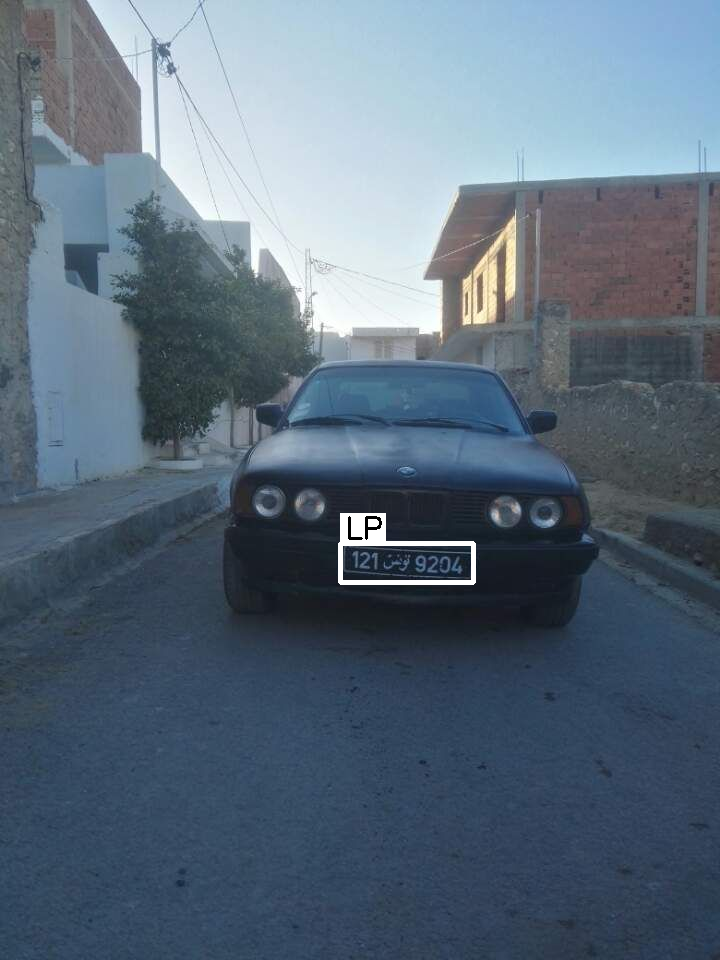

In [30]:
#Confirm that there are images by displaying an image
from IPython.display import display
display(dataset.visualize.ShowBoundingBoxes(8))
#display(dataset.visualize.ShowBoundingBoxes("322.jpg"))

In [31]:
print(f"Number of images: {dataset.analyze.num_images}")
print(f"Number of classes: {dataset.analyze.num_classes}")
print(f"Classes:{dataset.analyze.classes}")
print(f"Class counts:\n{dataset.analyze.class_counts}")

Number of images: 567
Number of classes: 1
Classes:['LP']
Class counts:
LP    567
Name: cat_name, dtype: int64


In [32]:
dataset.export.ExportToCoco()

['/content/converted_data/train/annotations/train_Dataset.json']

In [33]:
os.mkdir("/content/converted_data/train/labels")

In [34]:
os.chdir("/content/converted_data/train/labels")

In [35]:
path_to_annotations = "/content/converted_data/train/annotations/train_Dataset.json"
path_to_images = "/content/converted_data/train/images/"

In [36]:
#Import the dataset into the pylable schema 
dataset = importer.ImportCoco(path_to_annotations, path_to_images=path_to_images, name="BCCD_coco")
dataset.df.head(5)

,img_folder,img_filename,img_path,img_id,img_width,img_height,img_depth,ann_segmented,ann_bbox_xmin,ann_bbox_ymin,...,ann_segmentation,ann_iscrowd,ann_pose,ann_truncated,ann_difficult,cat_id,cat_name,cat_supercategory,split,annotated
id,,,,,,,,,,,,,,,,,,,,,
0,/content/converted_data/train/images/,299.jpg,,0,2000,1500,3,0,1264.0,999.0,...,,0,Unspecified,0,0,0,LP,,,1
1,/content/converted_data/train/images/,410.jpg,,1,720,960,3,0,213.0,630.0,...,,0,Unspecified,0,0,0,LP,,,1
2,/content/converted_data/train/images/,666.jpg,,2,720,960,3,0,272.0,651.0,...,,0,Unspecified,0,0,0,LP,,,1
3,/content/converted_data/train/images/,664.jpg,,3,720,960,3,0,229.0,576.0,...,,0,Unspecified,0,0,0,LP,,,1
4,/content/converted_data/train/images/,243.jpg,,4,864,648,3,0,395.0,517.0,...,,0,Unspecified,0,0,0,LP,,,1


In [37]:
print(f"Number of images: {dataset.analyze.num_images}")
print(f"Number of classes: {dataset.analyze.num_classes}")
print(f"Classes:{dataset.analyze.classes}")
print(f"Class counts:\n{dataset.analyze.class_counts}")
print(f"Path to annotations:\n{dataset.path_to_annotations}")

Number of images: 567
Number of classes: 1
Classes:['LP']
Class counts:
LP    567
Name: cat_name, dtype: int64
Path to annotations:
/content/converted_data/train/annotations


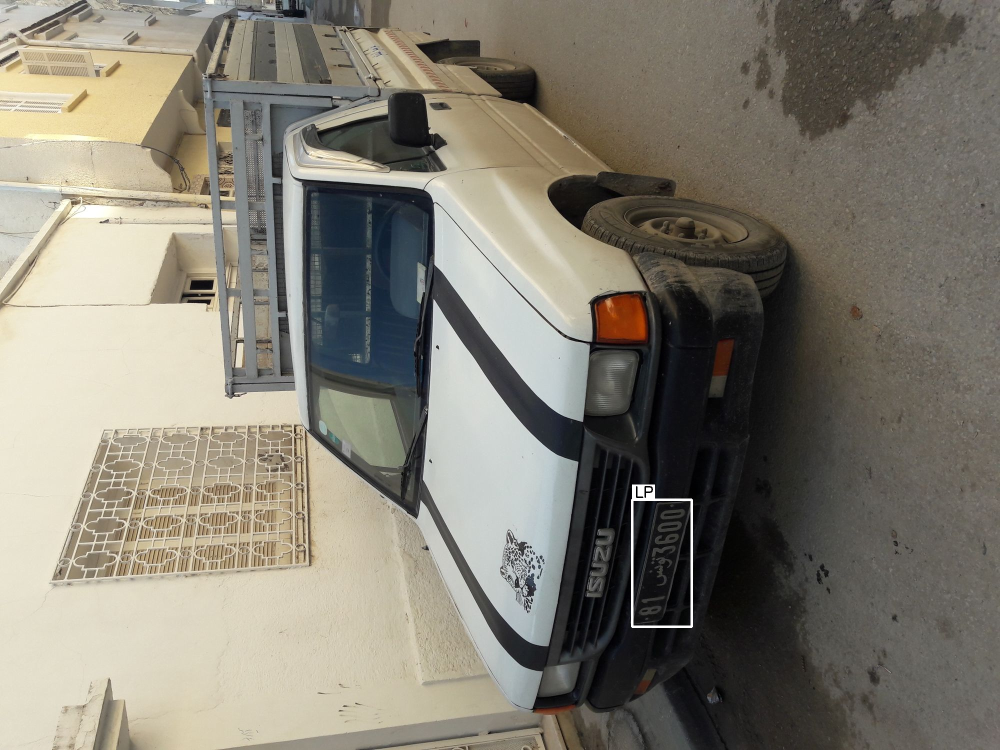

In [38]:
from IPython.display import Image, display
display(dataset.visualize.ShowBoundingBoxes(0))
#display(dataset.visualize.ShowBoundingBoxes("226.jpg"))

In [39]:
dataset.path_to_annotations = "/content/converted_data/train/labels"
dataset.export.ExportToYoloV5()

['training/dataset.yaml',
 'training/labels/299.txt',
 'training/labels/410.txt',
 'training/labels/666.txt',
 'training/labels/664.txt',
 'training/labels/243.txt',
 'training/labels/689.txt',
 'training/labels/600.txt',
 'training/labels/257.txt',
 'training/labels/384.txt',
 'training/labels/435.txt',
 'training/labels/382.txt',
 'training/labels/323.txt',
 'training/labels/261.txt',
 'training/labels/233.txt',
 'training/labels/706.txt',
 'training/labels/360.txt',
 'training/labels/556.txt',
 'training/labels/412.txt',
 'training/labels/670.txt',
 'training/labels/456.txt',
 'training/labels/495.txt',
 'training/labels/267.txt',
 'training/labels/327.txt',
 'training/labels/178.txt',
 'training/labels/277.txt',
 'training/labels/185.txt',
 'training/labels/585.txt',
 'training/labels/465.txt',
 'training/labels/642.txt',
 'training/labels/564.txt',
 'training/labels/538.txt',
 'training/labels/231.txt',
 'training/labels/688.txt',
 'training/labels/517.txt',
 'training/labels/301.

In [40]:
show_nb_files("/content/converted_data/train/labels/training/labels")

Number of files : 567


In [41]:
! pwd

/content/converted_data/train/labels


In [42]:
os.chdir("/content/converted_data/test")

### **Testing set**

In [43]:
import logging
logging.getLogger().setLevel(logging.CRITICAL)
!pip install pylabel > /dev/null

In [44]:
from pylabel import importer

In [45]:
path_to_annotations = "/content/converted_data/test/annotations/"
path_to_images = "/content/converted_data/test/images/"

In [46]:
dataset = importer.ImportVOC(path=path_to_annotations, path_to_images=path_to_images, name="train_Dataset")
dataset.df.head(5)

,img_folder,img_filename,img_path,img_id,img_width,img_height,img_depth,ann_segmented,ann_bbox_xmin,ann_bbox_ymin,...,ann_segmentation,ann_iscrowd,ann_pose,ann_truncated,ann_difficult,cat_id,cat_name,cat_supercategory,split,annotated
id,,,,,,,,,,,,,,,,,,,,,
0,/content/converted_data/test/images/,43.jpg,NaN,0,690,513,3,0,287.0,298.0,...,NaN,NaN,Unspecified,0,0,0,LP,NaN,,1
1,/content/converted_data/test/images/,55.jpg,NaN,1,690,518,3,0,500.0,282.0,...,NaN,NaN,Unspecified,0,0,0,LP,NaN,,1
2,/content/converted_data/test/images/,13.jpg,NaN,2,690,393,3,0,415.0,188.0,...,NaN,NaN,Unspecified,0,0,0,LP,NaN,,1
3,/content/converted_data/test/images/,48.jpg,NaN,3,690,388,3,0,54.0,271.0,...,NaN,NaN,Unspecified,0,0,0,LP,NaN,,1
4,/content/converted_data/test/images/,103.jpg,NaN,4,1000,747,3,0,292.0,524.0,...,NaN,NaN,Unspecified,0,0,0,LP,NaN,,1


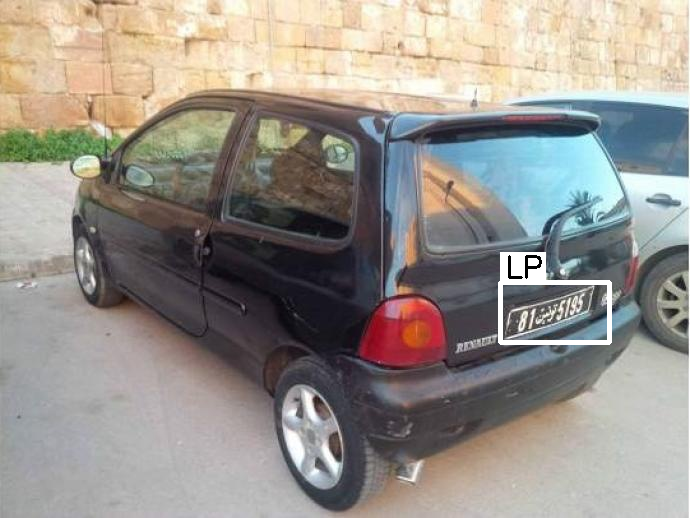

In [47]:
#Confirm that there are images by displaying an image
from IPython.display import display
display(dataset.visualize.ShowBoundingBoxes(1))
#display(dataset.visualize.ShowBoundingBoxes("66.jpg"))

In [48]:
print(f"Number of images: {dataset.analyze.num_images}")
print(f"Number of classes: {dataset.analyze.num_classes}")
print(f"Classes:{dataset.analyze.classes}")
print(f"Class counts:\n{dataset.analyze.class_counts}")

Number of images: 142
Number of classes: 1
Classes:['LP']
Class counts:
LP    142
Name: cat_name, dtype: int64


In [49]:
dataset.export.ExportToCoco()

['/content/converted_data/test/annotations/train_Dataset.json']

In [50]:
os.mkdir("/content/converted_data/test/labels")

In [51]:
os.chdir("/content/converted_data/test/labels")

In [52]:
path_to_annotations = "/content/converted_data/test/annotations/train_Dataset.json"
path_to_images = "/content/converted_data/test/images/"

In [53]:
#Import the dataset into the pylable schema 
dataset = importer.ImportCoco(path_to_annotations, path_to_images=path_to_images, name="BCCD_coco")
dataset.df.head(5)

,img_folder,img_filename,img_path,img_id,img_width,img_height,img_depth,ann_segmented,ann_bbox_xmin,ann_bbox_ymin,...,ann_segmentation,ann_iscrowd,ann_pose,ann_truncated,ann_difficult,cat_id,cat_name,cat_supercategory,split,annotated
id,,,,,,,,,,,,,,,,,,,,,
0,/content/converted_data/test/images/,43.jpg,,0,690,513,3,0,287.0,298.0,...,,0,Unspecified,0,0,0,LP,,,1
1,/content/converted_data/test/images/,55.jpg,,1,690,518,3,0,500.0,282.0,...,,0,Unspecified,0,0,0,LP,,,1
2,/content/converted_data/test/images/,13.jpg,,2,690,393,3,0,415.0,188.0,...,,0,Unspecified,0,0,0,LP,,,1
3,/content/converted_data/test/images/,48.jpg,,3,690,388,3,0,54.0,271.0,...,,0,Unspecified,0,0,0,LP,,,1
4,/content/converted_data/test/images/,103.jpg,,4,1000,747,3,0,292.0,524.0,...,,0,Unspecified,0,0,0,LP,,,1


In [54]:
print(f"Number of images: {dataset.analyze.num_images}")
print(f"Number of classes: {dataset.analyze.num_classes}")
print(f"Classes:{dataset.analyze.classes}")
print(f"Class counts:\n{dataset.analyze.class_counts}")
print(f"Path to annotations:\n{dataset.path_to_annotations}")

Number of images: 142
Number of classes: 1
Classes:['LP']
Class counts:
LP    142
Name: cat_name, dtype: int64
Path to annotations:
/content/converted_data/test/annotations


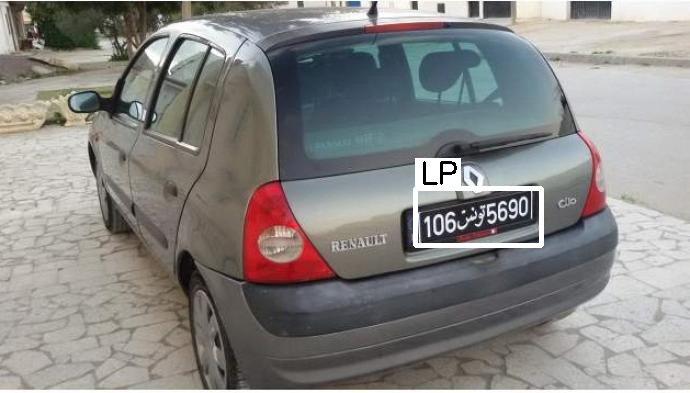

In [55]:
from IPython.display import Image, display
display(dataset.visualize.ShowBoundingBoxes(2))
#display(dataset.visualize.ShowBoundingBoxes("226.jpg"))

In [56]:
dataset.path_to_annotations = "/content/converted_data/test/labels"
dataset.export.ExportToYoloV5()

['training/dataset.yaml',
 'training/labels/43.txt',
 'training/labels/55.txt',
 'training/labels/13.txt',
 'training/labels/48.txt',
 'training/labels/103.txt',
 'training/labels/127.txt',
 'training/labels/63.txt',
 'training/labels/112.txt',
 'training/labels/119.txt',
 'training/labels/45.txt',
 'training/labels/114.txt',
 'training/labels/87.txt',
 'training/labels/27.txt',
 'training/labels/7.txt',
 'training/labels/126.txt',
 'training/labels/96.txt',
 'training/labels/141.txt',
 'training/labels/5.txt',
 'training/labels/69.txt',
 'training/labels/83.txt',
 'training/labels/28.txt',
 'training/labels/25.txt',
 'training/labels/64.txt',
 'training/labels/57.txt',
 'training/labels/78.txt',
 'training/labels/73.txt',
 'training/labels/56.txt',
 'training/labels/100.txt',
 'training/labels/123.txt',
 'training/labels/74.txt',
 'training/labels/70.txt',
 'training/labels/0.txt',
 'training/labels/35.txt',
 'training/labels/129.txt',
 'training/labels/20.txt',
 'training/labels/80.t

In [57]:
os.rename("/content/converted_data/test/labels/training", "/content/converted_data/test/labels/testing")

In [58]:
show_nb_files("/content/converted_data/test/labels/testing/labels")

Number of files : 142


## Modeling

In [59]:
os.mkdir("/content/Final_dataset")
os.mkdir("/content/Final_dataset/images")
os.mkdir("/content/Final_dataset/labels")
os.mkdir("/content/Final_dataset/images/train")
os.mkdir("/content/Final_dataset/images/val")
os.mkdir("/content/Final_dataset/labels/train")
os.mkdir("/content/Final_dataset/labels/val")
os.mkdir("/content/Final_dataset/images/test")
os.mkdir("/content/Final_dataset/labels/test")

In [60]:
def copy_files(src,trg):
  files=os.listdir(src)
  # iterating over all the files in
  # the source directory
  for fname in files:
    # copying the files to the
    # destination directory
    shutil.copy2(os.path.join(src,fname), trg)

In [61]:
copy_files("/content/converted_data/train/images","/content/Final_dataset/images/train")

In [62]:
copy_files("/content/converted_data/train/labels/training/labels","/content/Final_dataset/labels/train")

In [63]:
copy_files("/content/converted_data/test/images","/content/Final_dataset/images/val")

In [64]:
copy_files("/content/converted_data/test/labels/testing/labels","/content/Final_dataset/labels/val")

In [65]:
list_f = os.listdir("/content/Final_dataset/images/test") # dir is your directory path
number_files = len(list_f)
print(number_files)

0


In [66]:
list_v = os.listdir("/content/Final_dataset/images/val")
list_t = list_v[0:50]
source = r"/content/Final_dataset/images/val/"
destination = r"/content/Final_dataset/images/test"
for files in list_t:
  shutil.move(source + files, destination)

In [67]:
source = r"/content/Final_dataset/labels/val/"
destination = r"/content/Final_dataset/labels/test/"
list_c = os.listdir("/content/Final_dataset/images/test")
list_v = os.listdir("/content/Final_dataset/labels/val")

print(list_c)
for i in range(0, len(list_c)):
    element = list_c[i]
    list_c[i] = element[:-4]

for file in list_v:
  file_m = file[:-4]
  if file_m in list_c:
    shutil.move(source+file_m+".txt", destination)

['103.jpg', '27.jpg', '45.jpg', '0.jpg', '11.jpg', '20.jpg', '19.jpg', '4.jpg', '71.jpg', '84.jpg', '124.jpg', '111.jpg', '135.jpg', '53.jpg', '1.jpg', '32.jpg', '118.jpg', '106.jpg', '7.jpg', '42.jpg', '15.jpg', '78.jpg', '121.jpg', '70.jpg', '116.jpg', '75.jpg', '88.jpg', '34.jpg', '97.jpg', '119.jpg', '102.jpg', '40.jpg', '54.jpg', '64.jpg', '2.jpg', '66.jpg', '14.jpg', '26.jpg', '107.jpg', '77.jpg', '115.jpg', '41.jpg', '39.jpg', '31.jpg', '38.jpg', '101.jpg', '28.jpg', '9.jpg', '58.jpg', '86.jpg']


In [68]:
os.chdir("/content")

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.2-61-gffbce38 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.0/78.2 GB disk)


In [ ]:
with open("/content/yolov5/data/data.yaml","a") as file:
    file.write("train: /content/Final_dataset/images/train \n")
    file.write("val: /content/Final_dataset/images/val \n")
    file.write("test: /content/Final_dataset/images/test \n")
    file.write("\n")
    file.write("is_coco: False \n")
    file.write("\n")
    file.write("nc: 1 \n")
    file.write("names: ['LP'] \n")

In [ ]:
def monitor_tensorboard():
    %load_ext tensorboard
    %tensorboard --logdir runs/train

In [ ]:
!python train.py --img 416 --batch 16 --epochs 150 --data data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-3-gfe809b8 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degr

In [ ]:
! python val.py --data data.yaml --weights runs/train/exp/weights/best.pt --task test

val: data=/content/yolov5/data/data.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.2-3-gfe809b8 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning '/content/Final_dataset/labels/test' images and labels...50 found, 0 missing, 0 empty, 0 corrupt: 100% 50/50 [00:00<00:00, 269.02it/s]
test: New cache created: /content/Final_dataset/labels/test.cache
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 2/2 [00:02<00:00,  1.42s/it]
                 all         50         50      0.942      0.973      0.987      0.761
Speed: 0.2ms pre-process, 6.3ms inferen

In [ ]:
! python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source /content/Final_dataset/images/test

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/Final_dataset/images/test, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.2-3-gfe809b8 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/50 /content/Final_dataset/images/test/1.jpg: 416x256 1 LP, Done. (0.012s)
image 2/50 /content/Final_dataset/images/test/100.jpg: 256x416 4 LPs, Done. (0.013s)
image 3/50 /content/Final_dataset/images/test/104.jpg: 320x416 1 LP, Done. (0.011s)
image 4/50 /content/Final_dataset/images/test/106.jpg: 320x416 1 LP, Done. (0.008s)
image 5/50 /c

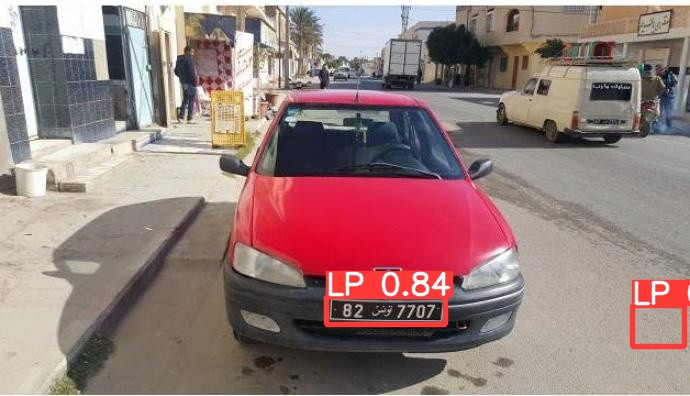

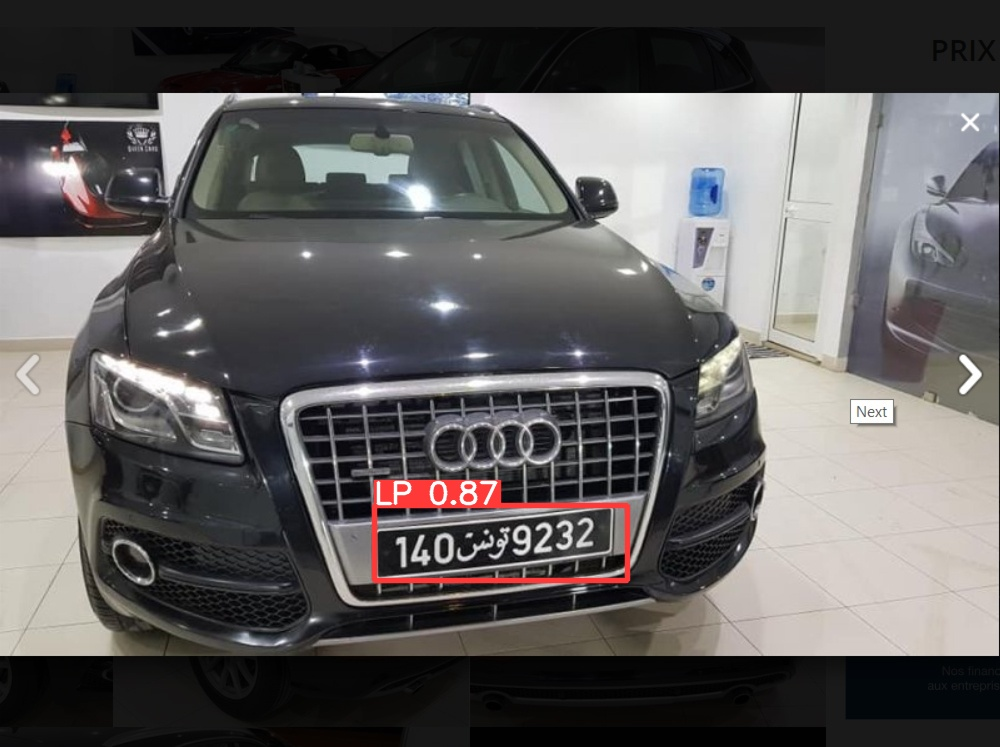

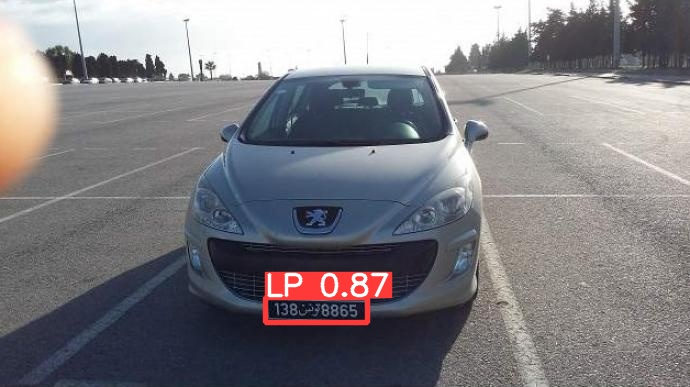

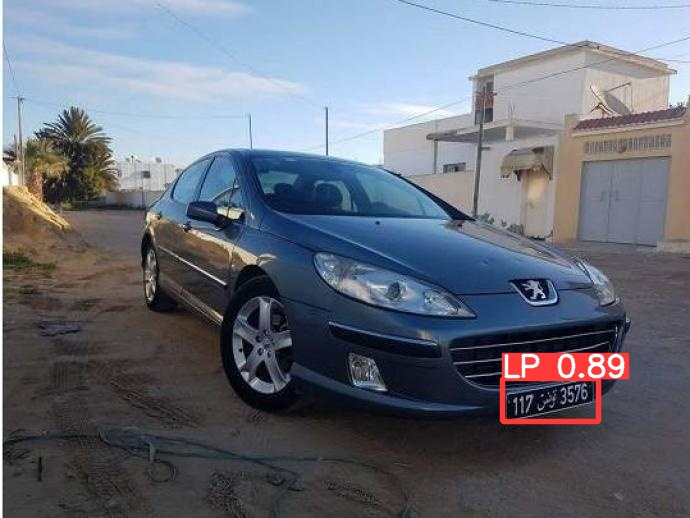

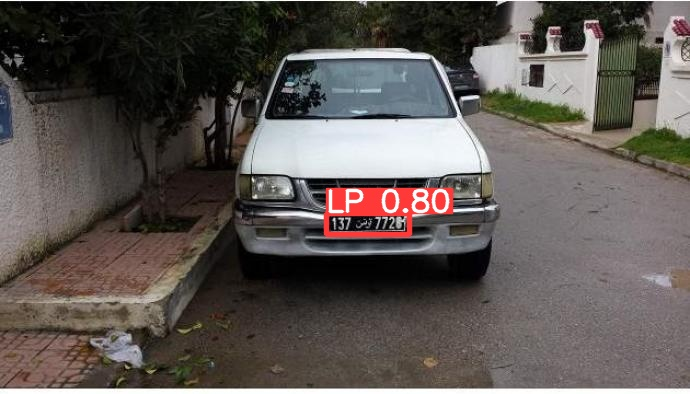

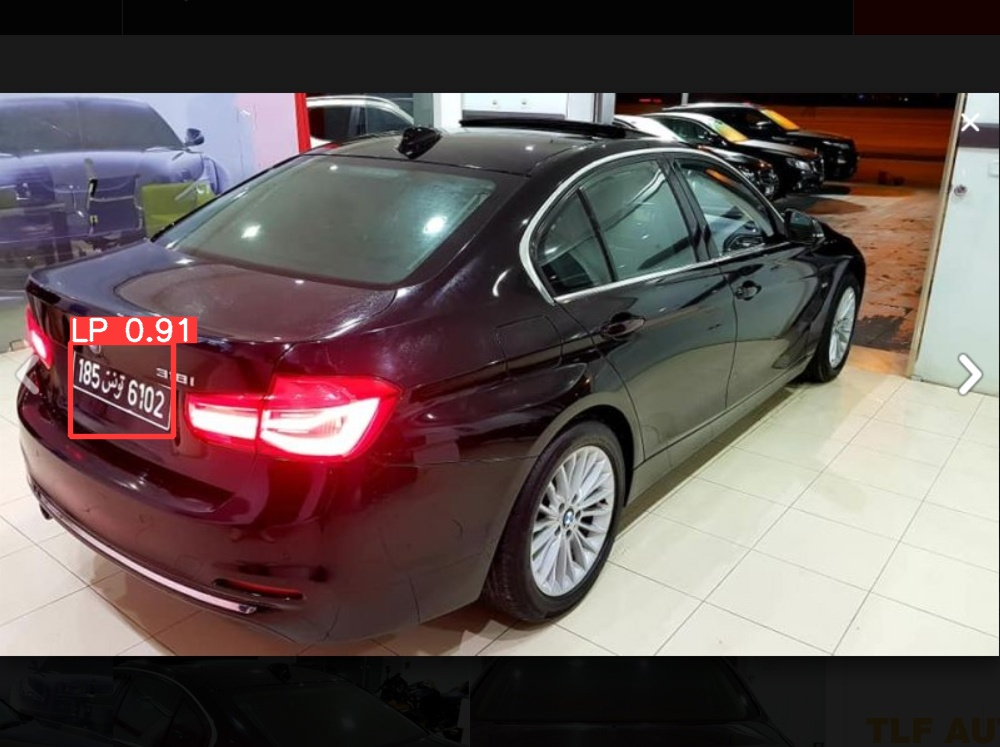

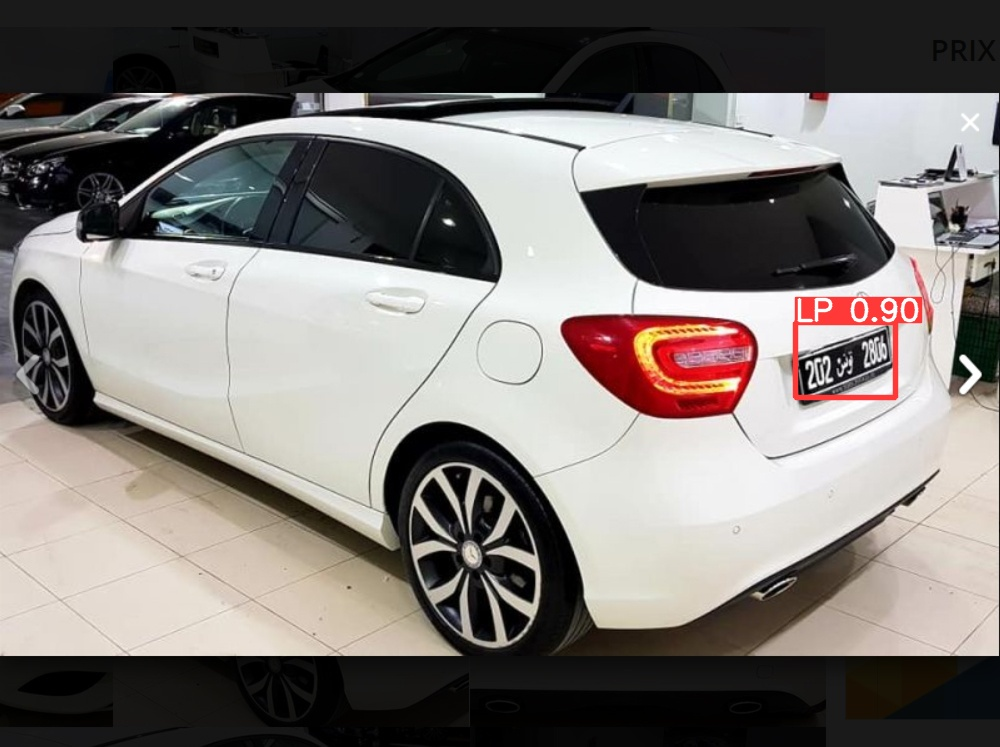

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
monitor_tensorboard()

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 943), started 0:04:09 ago. (Use '!kill 943' to kill it.)

<IPython.core.display.Javascript object>

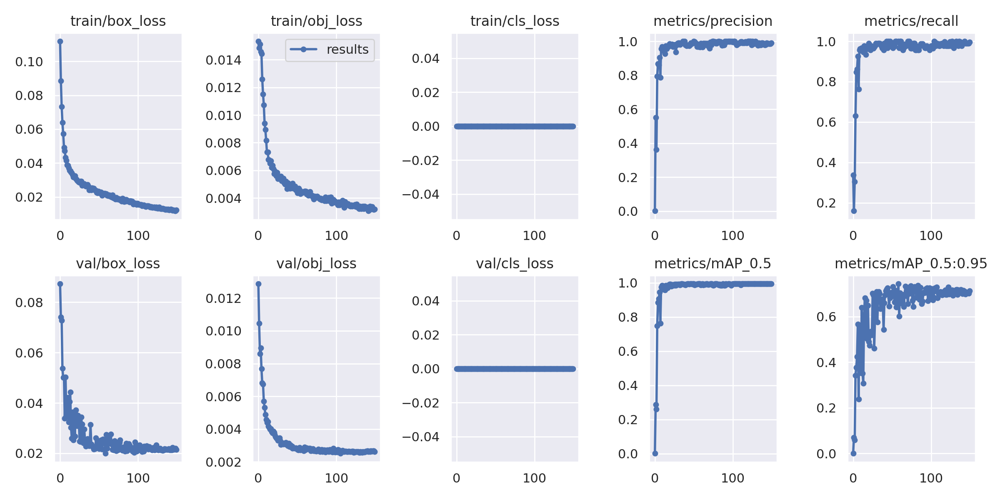

In [ ]:
display(Image(filename='/content/yolov5/runs/train/exp/results.png'))

In [ ]:
shutil.make_archive("/content/yolov5_license_plate", 'zip', "/content/yolov5")

'/content/yolov5_license_plate.zip'

In [ ]:
os.chdir("/content")

## **Region of interest**

First step, we want to crop the license plates from the images.

In [69]:
import cv2
from google.colab.patches import cv2_imshow

In [70]:
os.mkdir("Cropped_data")

In [71]:
for filename in os.listdir("/content/Final_dataset/labels/val"):
  with open("/content/Final_dataset/labels/val/"+filename) as f:
    #read an image
    img = cv2.imread("/content/Final_dataset/images/val/"+filename[:-4]+".jpg")
    dh, dw, _ = img.shape
    #read annotation file content
    contents = f.read()
    class_id, x_center, y_center, w, h = contents.strip().split()
    x_center, y_center, w, h = float(x_center), float(y_center), float(w), float(h)
    x_center = round(x_center * dw)
    y_center = round(y_center * dh)
    w = round(w * dw)
    h = round(h * dh)
    x = round(x_center - w / 2)
    y = round(y_center - h / 2)

    imgCrop = img[y:y + h, x:x + w]
    cv2.imwrite(os.path.join("/content/Cropped_data" , filename[:-4]+".jpg"), imgCrop)
    #cv2_imshow(imgCrop)

In [72]:
for filename in os.listdir("/content/Final_dataset/labels/test"):
  with open("/content/Final_dataset/labels/test/"+filename) as f:
    #read an image
    img = cv2.imread("/content/Final_dataset/images/test/"+filename[:-4]+".jpg")
    dh, dw, _ = img.shape
    #read annotation file content
    contents = f.read()
    class_id, x_center, y_center, w, h = contents.strip().split()
    x_center, y_center, w, h = float(x_center), float(y_center), float(w), float(h)
    x_center = round(x_center * dw)
    y_center = round(y_center * dh)
    w = round(w * dw)
    h = round(h * dh)
    x = round(x_center - w / 2)
    y = round(y_center - h / 2)

    imgCrop = img[y:y + h, x:x + w]
    cv2.imwrite(os.path.join("/content/Cropped_data" , filename[:-4]+".jpg"), imgCrop)
    #cv2_imshow(imgCrop)

In [73]:
for filename in os.listdir("/content/Final_dataset/labels/train"):
  with open("/content/Final_dataset/labels/train/"+filename) as f:
    #read an image
    img = cv2.imread("/content/Final_dataset/images/train/"+filename[:-4]+".jpg")
    dh, dw, _ = img.shape
    #read annotation file content
    contents = f.read()
    class_id, x_center, y_center, w, h = contents.strip().split()
    x_center, y_center, w, h = float(x_center), float(y_center), float(w), float(h)
    x_center = round(x_center * dw)
    y_center = round(y_center * dh)
    w = round(w * dw)
    h = round(h * dh)
    x = round(x_center - w / 2)
    y = round(y_center - h / 2)

    imgCrop = img[y:y + h, x:x + w]
    cv2.imwrite(os.path.join("/content/Cropped_data" , filename[:-4]+".jpg"), imgCrop)
    #cv2_imshow(imgCrop)

In [74]:
show_nb_files("/content/Cropped_data")

Number of files : 709


In [75]:
# ignore warning 
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

from keras.preprocessing.image import ImageDataGenerator
from keras.applications.mobilenet_v2 import MobileNetV2
from keras.layers import AveragePooling2D
from keras.layers import Dropout
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Input
from keras.models import Model
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img
from tensorflow.keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.models import model_from_json
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import glob
import numpy as np

In [76]:
os.mkdir("/content/dataset_characters")
os.mkdir("/content/Character_Recognition_from_Number_Plate")

In [78]:
from zipfile import ZipFile
zf = ZipFile('/content/drive/MyDrive/Cars_dataset/Characters/dataset_characters.zip', 'r')
zf.extractall('/content/dataset_characters')
zf.close()

In [79]:
from zipfile import ZipFile
zf = ZipFile('/content/drive/MyDrive/Cars_dataset/Characters/Character-Recognition-from-Number-Plate.zip', 'r')
zf.extractall('/content/Character_Recognition_from_Number_Plate')
zf.close()

10606
[ 7115  6558  6012   163  8772  3704   577  8590  8054  7349 10264  6412]


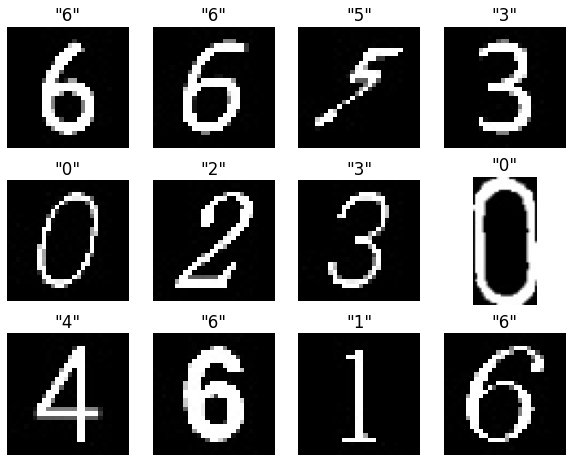

In [80]:
dataset_paths = glob.glob("/content/dataset_characters/dataset_characters/dataset_characters/**/*.jpg")

cols=4
rows=3
fig = plt.figure(figsize=(10,8))
plt.rcParams.update({"font.size":14})
grid = gridspec.GridSpec(ncols=cols,nrows=rows,figure=fig)

# create a random list of images will be displayed
np.random.seed(45)
print(len(dataset_paths))
rand = np.random.randint(0,len(dataset_paths),size=(cols*rows))
print(rand)
# Plot image
for i in range(cols*rows):
    fig.add_subplot(grid[i])
    image = load_img(dataset_paths[rand[i]])
    label = dataset_paths[rand[i]].split(os.path.sep)[-2]
    plt.title('"{:s}"'.format(label))
    plt.axis(False)
    plt.imshow(image)

plt.savefig("Visualize_dataset.jpg",dpi=300) 

In [81]:
# Arange input data and corresponding labels
X=[]
labels=[]

for image_path in dataset_paths:
  label = image_path.split(os.path.sep)[-2]
  image=load_img(image_path,target_size=(80,80))
  image=img_to_array(image)

  X.append(image)
  labels.append(label)

X = np.array(X,dtype="float16")
labels = np.array(labels)

print("[INFO] Find {:d} images with {:d} classes".format(len(X),len(set(labels))))


# perform one-hot encoding on the labels
lb = LabelEncoder()
lb.fit(labels)
labels = lb.transform(labels)
y = to_categorical(labels)

# save label file so we can use in another script
np.save('/content/license_character_classes.npy', lb.classes_)

[INFO] Find 10606 images with 10 classes


In [82]:
# split 10% of data as validation set
(trainX, testX, trainY, testY) = train_test_split(X, y, test_size=0.10, stratify=y, random_state=42)

In [83]:
# data augumentation
image_gen = ImageDataGenerator(rotation_range=10,
                              width_shift_range=0.1,
                              height_shift_range=0.1,
                              shear_range=0.1,
                              zoom_range=0.1,
                              fill_mode="nearest"
                              )

In [84]:
from keras import backend as K

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [85]:
# Create our model with pre-trained MobileNetV2 architecture from imagenet
def create_model(lr=1e-4,decay=1e-4/25, training=False,output_shape=y.shape[1]):
    baseModel = MobileNetV2(weights="imagenet", 
                            include_top=False,
                            input_tensor=Input(shape=(80, 80, 3)))

    headModel = baseModel.output
    headModel = AveragePooling2D(pool_size=(3, 3))(headModel)
    headModel = Flatten(name="flatten")(headModel)
    headModel = Dense(128, activation="relu")(headModel)
    headModel = Dropout(0.5)(headModel)
    headModel = Dense(output_shape, activation="softmax")(headModel)
    
    model = Model(inputs=baseModel.input, outputs=headModel)
    
    if training:
        # define trainable lalyer
        for layer in baseModel.layers:
            layer.trainable = True
        # compile model
        optimizer = Adam(lr=lr, decay = decay)
        model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=['acc',f1_m,precision_m, recall_m])    
        
    return model

In [86]:
# initilaize initial hyperparameter
INIT_LR = 1e-4
EPOCHS = 10

model = create_model(lr=INIT_LR, decay=INIT_LR/EPOCHS,training=True)

9420800/9406464 [==============================] - 0s 0us/step


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [87]:
BATCH_SIZE = 64

my_checkpointer = [
                EarlyStopping(monitor='val_loss', patience=5, verbose=0),
                ModelCheckpoint(filepath="License_character_recognition.h5", verbose=1, save_weights_only=True)
                ]

result = model.fit(image_gen.flow(trainX, trainY, batch_size=BATCH_SIZE), 
                   steps_per_epoch=len(trainX) // BATCH_SIZE, 
                   validation_data=(testX, testY), 
                   validation_steps=len(testX) // BATCH_SIZE, 
                   epochs=EPOCHS, callbacks=my_checkpointer)

Epoch 1/10
149/149 [==============================] - ETA: 0s - loss: 1.1580 - acc: 0.6273 - f1_m: 0.5638 - precision_m: 0.7858 - recall_m: 0.4714
Epoch 1: saving model to License_character_recognition.h5
149/149 [==============================] - 37s 132ms/step - loss: 1.1580 - acc: 0.6273 - f1_m: 0.5638 - precision_m: 0.7858 - recall_m: 0.4714 - val_loss: 1.9370 - val_acc: 0.4618 - val_f1_m: 0.4487 - val_precision_m: 0.4953 - val_recall_m: 0.4106
Epoch 2/10
149/149 [==============================] - ETA: 0s - loss: 0.2915 - acc: 0.9118 - f1_m: 0.9135 - precision_m: 0.9561 - recall_m: 0.8755
Epoch 2: saving model to License_character_recognition.h5
149/149 [==============================] - 17s 117ms/step - loss: 0.2915 - acc: 0.9118 - f1_m: 0.9135 - precision_m: 0.9561 - recall_m: 0.8755 - val_loss: 2.4320 - val_acc: 0.5108 - val_f1_m: 0.5099 - val_precision_m: 0.5344 - val_recall_m: 0.4880
Epoch 3/10
149/149 [==============================] - ETA: 0s - loss: 0.1603 - acc: 0.9502 - f

In [88]:
import tensorflow.keras.backend as K
test_datagen = ImageDataGenerator(rescale=1./255, width_shift_range=0.1, height_shift_range=0.1)
path = '/content/Character_Recognition_from_Number_Plate/Character-Recognition-from-Number-Plate'

test_generator = test_datagen.flow_from_directory(
        path+'/Testing Data',  # this is the target directory
        target_size=(80,80),  # all images will be resized to 28x28 batch_size=1,
        class_mode='sparse')

Found 240 images belonging to 10 classes.


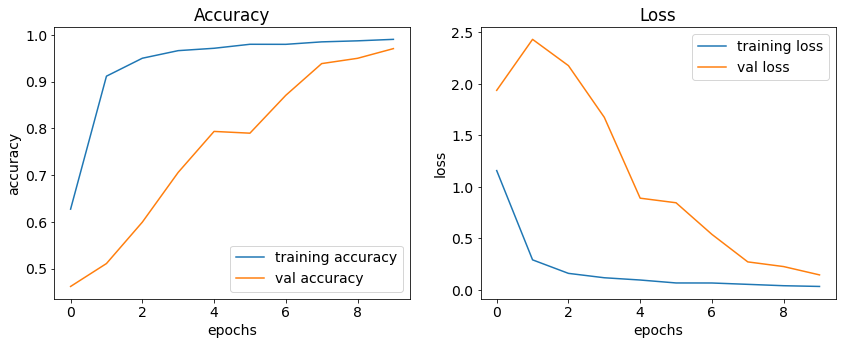

In [89]:
fig = plt.figure(figsize=(14,5))
grid=gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[0])
plt.plot(result.history['acc'], label='training accuracy')
plt.plot(result.history['val_acc'], label='val accuracy')
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()

fig.add_subplot(grid[1])
plt.plot(result.history['loss'], label='training loss')
plt.plot(result.history['val_loss'], label='val loss')
plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()

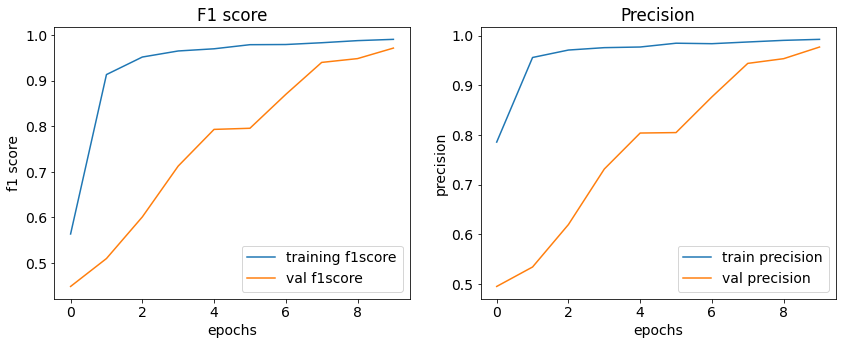

In [90]:
fig = plt.figure(figsize=(14,5))
grid=gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[0])
plt.plot(result.history['f1_m'], label='training f1score')
plt.plot(result.history['val_f1_m'], label='val f1score')
plt.title('F1 score')
plt.xlabel('epochs')
plt.ylabel('f1 score')
plt.legend()

fig.add_subplot(grid[1])
plt.plot(result.history['precision_m'], label='train precision')
plt.plot(result.history['val_precision_m'], label='val precision')
plt.title('Precision')
plt.xlabel('epochs')
plt.ylabel('precision')
plt.legend()

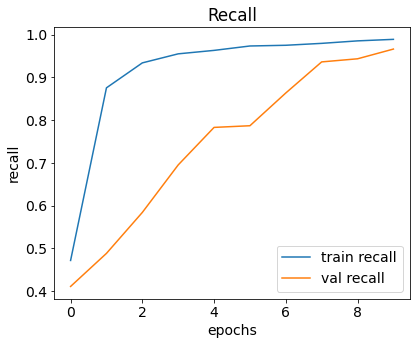

In [91]:
fig = plt.figure(figsize=(14,5))
grid=gridspec.GridSpec(ncols=2,nrows=1,figure=fig)
fig.add_subplot(grid[0])
plt.plot(result.history['recall_m'], label='train recall')
plt.plot(result.history['val_recall_m'], label='val recall')
plt.title('Recall')
plt.xlabel('epochs')
plt.ylabel('recall')
plt.legend()

In [92]:
# save model architectur as json file
model_json = model.to_json()
with open("/content/MobileNets_character_recognition.json", "w") as json_file:
  json_file.write(model_json)

In [93]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [94]:
def display(img_, title=''):
    img = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    fig = plt.figure(figsize=(10,6))
    ax = plt.subplot(111)
    ax.imshow(img)
    plt.axis('off')
    plt.title(title)
    plt.show()

In [95]:
output_img = cv2.imread('/content/Cropped_data/100.jpg')

In [96]:

# Convert to float and divide by 255:
imgFloat = output_img.astype(np.float) / 255.

# Calculate channel K:
kChannel = 1 - np.max(imgFloat, axis=2)

# Convert back to uint 8:
kChannel = (255 * kChannel).astype(np.uint8)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


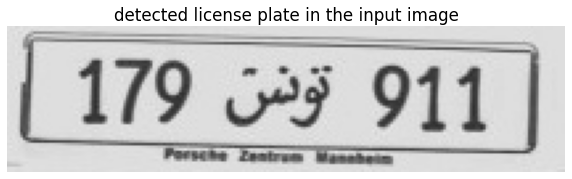

In [97]:
display(kChannel, 'detected license plate in the input image')

In [98]:
cv2.imwrite('/content/image_test.png', kChannel)

True

In [99]:
output_image = cv2.imread('/content/image_test.png')

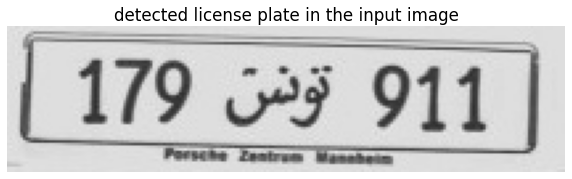

In [100]:
display(output_image, 'detected license plate in the input image')

In [101]:
# Threshold image:
binaryThresh = 190
_, binaryImage = cv2.threshold(kChannel, binaryThresh, 255, cv2.THRESH_BINARY)

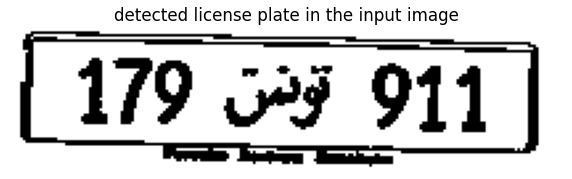

In [102]:
display(binaryImage, 'detected license plate in the input image')

In [107]:
# Match contours to license plate or character template
def find_contours(dimensions, img) :

    # Find all contours in the image
    cntrs, _ = cv2.findContours(img.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Retrieve potential dimensions
    lower_width = dimensions[0]
    upper_width = dimensions[1]
    lower_height = dimensions[2]
    upper_height = dimensions[3]
    
    # Check largest 5 or  15 contours for license plate or character respectively
    cntrs = sorted(cntrs, key=cv2.contourArea, reverse=True)[:15]
    
    ii = cv2.imread('contour.jpg')
    
    x_cntr_list = []
    target_contours = []
    img_res = []
    for cntr in cntrs :
        # detects contour in binary image and returns the coordinates of rectangle enclosing it
        intX, intY, intWidth, intHeight = cv2.boundingRect(cntr)
        
        # checking the dimensions of the contour to filter out the characters by contour's size
        if intWidth > lower_width and intWidth < upper_width and intHeight > lower_height and intHeight < upper_height :
            x_cntr_list.append(intX) #stores the x coordinate of the character's contour, to used later for indexing the contours

            char_copy = np.zeros((44,24))
            # extracting each character using the enclosing rectangle's coordinates.
            char = img[intY:intY+intHeight, intX:intX+intWidth]
            char = cv2.resize(char, (20, 40))
            
            cv2.rectangle(ii, (intX,intY), (intWidth+intX, intY+intHeight), (50,21,200), 2)
            plt.imshow(ii, cmap='gray')

            # Make result formatted for classification: invert colors
            char = cv2.subtract(255, char)
            # Resize the image to 24x44 with black border
            char_copy[2:42, 2:22] = char
            char_copy[0:2, :] = 0
            char_copy[:, 0:2] = 0
            char_copy[42:44, :] = 0
            char_copy[:, 22:24] = 0

            img_res.append(char_copy) # List that stores the character's binary image (unsorted)
            
    # Return characters on ascending order with respect to the x-coordinate (most-left character first)
    plt.show()
    # arbitrary function that stores sorted list of character indeces
    indices = sorted(range(len(x_cntr_list)), key=lambda k: x_cntr_list[k])
    img_res_copy = []
    for idx in indices:
        img_res_copy.append(img_res[idx])# stores character images according to their index
    img_res = np.array(img_res_copy)

    return img_res

def segment_characters(image) :

    # Preprocess cropped license plate image
    img_lp = cv2.resize(image, (333, 75))
    img_gray_lp = cv2.cvtColor(img_lp, cv2.COLOR_BGR2GRAY)
    _, img_binary_lp = cv2.threshold(img_gray_lp, 200, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    img_binary_lp = cv2.erode(img_binary_lp, (3,3))
    img_binary_lp = cv2.dilate(img_binary_lp, (3,3))

    LP_WIDTH = img_binary_lp.shape[0]
    LP_HEIGHT = img_binary_lp.shape[1]

    # Make borders white
    img_binary_lp[0:3,:] = 255
    img_binary_lp[:,0:3] = 255
    img_binary_lp[72:75,:] = 255
    img_binary_lp[:,330:333] = 255

    # Estimations of character contours sizes of cropped license plates
    dimensions = [LP_WIDTH/6,
                       LP_WIDTH/2,
                       LP_HEIGHT/10,
                       2*LP_HEIGHT/3]
    plt.imshow(img_binary_lp, cmap='gray')
    plt.show()
    cv2.imwrite('contour.jpg',img_binary_lp)

    # Get contours within cropped license plate
    char_list = find_contours(dimensions, img_binary_lp)

    return char_list

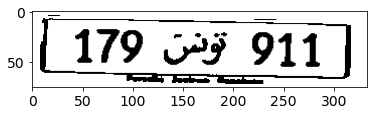

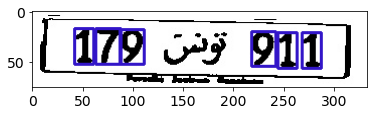

In [108]:
# Let's see the segmented characters
char = segment_characters(output_image)

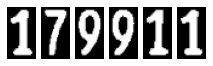

In [109]:
for i in range(6):
    plt.subplot(1, 10, i+1)
    plt.imshow(char[i], cmap='gray')
    plt.axis('off')

In [110]:
import matplotlib.gridspec as gridspec
# from local_utils import detect_lp
from os.path import splitext,basename
from keras.models import model_from_json
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.mobilenet_v2 import preprocess_input
from sklearn.preprocessing import LabelEncoder
import glob

In [111]:
json_file = open('/content/MobileNets_character_recognition.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
model.load_weights("/content/License_character_recognition.h5")
print("[INFO] Model loaded successfully...")

labels = LabelEncoder()
labels.classes_ = np.load('/content/license_character_classes.npy')
print("[INFO] Labels loaded successfully...")

[INFO] Model loaded successfully...
[INFO] Labels loaded successfully...


In [112]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 80, 80, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 40, 40, 32)   864         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 40, 40, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 40, 40, 32)   0           ['bn_Conv1[0][0]']               
                                                                                              

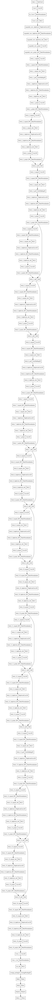

In [113]:
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='inception_v3_with_dense_layers_model.png', show_shapes=False, show_layer_names=True)

In [114]:
# pre-processing input images and pedict with model
def predict_from_model(image,model,labels):
    image = cv2.resize(image,(80,80))
    image = np.stack((image,)*3, axis=-1)
    prediction = labels.inverse_transform([np.argmax(model.predict(image[np.newaxis,:]))])
    return prediction

179911


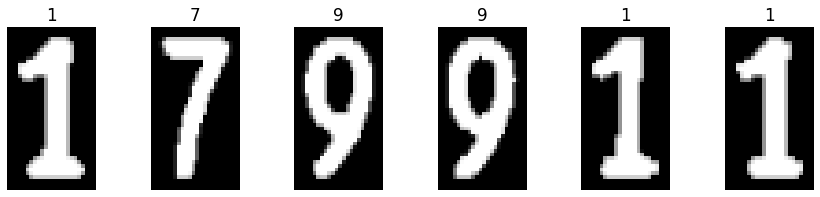

In [115]:
fig = plt.figure(figsize=(15,3))
cols = len(char)
grid = gridspec.GridSpec(ncols=cols,nrows=1,figure=fig)

final_string = ''
for i,character in enumerate(char):
    fig.add_subplot(grid[i])
    title = np.array2string(predict_from_model(character,model,labels))
    plt.title('{}'.format(title.strip("'[]"),fontsize=20))
    final_string+=title.strip("'[]")
    plt.axis(False)
    plt.imshow(character,cmap='gray')

print(final_string)

## **Paddle OCR**

In [116]:
! pip install paddlepaddle-gpu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 394.0 MB 25 kB/s 
     |████████████████████████████████| 394 kB 74.4 MB/s 


In [117]:
!pip install "paddleocr>=2.0.1"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 389 kB 38.6 MB/s 
     |████████████████████████████████| 604 kB 62.0 MB/s 
     |████████████████████████████████| 2.3 MB 54.7 MB/s 
     |████████████████████████████████| 4.9 MB 62.7 MB/s 
     |████████████████████████████████| 399 kB 69.7 MB/s 
     |████████████████████████████████| 104 kB 66.9 MB/s 
     |████████████████████████████████| 204 kB 62.3 MB/s 
     |████████████████████████████████| 2.3 MB 38.6 MB/s 


In [118]:
from paddleocr import PaddleOCR,draw_ocr
ocr = PaddleOCR(use_angle_cls=True, lang='ar')

download https://paddleocr.bj.bcebos.com/PP-OCRv3/multilingual/Multilingual_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/ml/Multilingual_PP-OCRv3_det_infer/Multilingual_PP-OCRv3_det_infer.tar


100%|██████████| 3.85M/3.85M [00:00<00:00, 5.65MiB/s]


download https://paddleocr.bj.bcebos.com/PP-OCRv3/multilingual/arabic_PP-OCRv3_rec_infer.tar to /root/.paddleocr/whl/rec/arabic/arabic_PP-OCRv3_rec_infer/arabic_PP-OCRv3_rec_infer.tar


100%|██████████| 10.3M/10.3M [00:09<00:00, 1.15MiB/s]


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2.19M/2.19M [00:05<00:00, 400kiB/s]

[2022/09/07 14:41:34] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_fce_box_type='poly', det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/ml/Multilingual_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_box_type='quad', det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_polygon=False, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgn

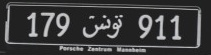

In [119]:
img_path = '/content/Cropped_data/100.jpg'

img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

In [120]:
result = ocr.ocr(img_path, cls=True)
for line in result:
    print(line)

[2022/09/07 14:41:49] ppocr DEBUG: dt_boxes num : 3, elapse : 4.670226097106934
[2022/09/07 14:41:49] ppocr DEBUG: cls num  : 3, elapse : 0.017966032028198242
[2022/09/07 14:41:49] ppocr DEBUG: rec_res num  : 3, elapse : 0.020617008209228516
[[[24.0, 9.0], [73.0, 9.0], [73.0, 40.0], [24.0, 40.0]], ('179', 0.9224894046783447)]
[[[78.0, 11.0], [126.0, 11.0], [126.0, 42.0], [78.0, 42.0]], ('تونس', 0.9466626644134521)]
[[[135.0, 12.0], [186.0, 12.0], [186.0, 43.0], [135.0, 43.0]], ('911', 0.9946349263191223)]


In [121]:
# draw result
from PIL import Image, ImageDraw, ImageFont
image = Image.open(img_path).convert('RGB')

boxes = [line[0] for line in result]
txts = [line[1][0] for line in result]
scores = [line[1][1] for line in result]
font = ImageFont.load_default()
im_show = draw_ocr(image, boxes, txts, scores,font_path='/usr/share/fonts/truetype/humor-sans/Humor-Sans.ttf' )
im_show = Image.fromarray(im_show)
im_show.save('result.jpg')


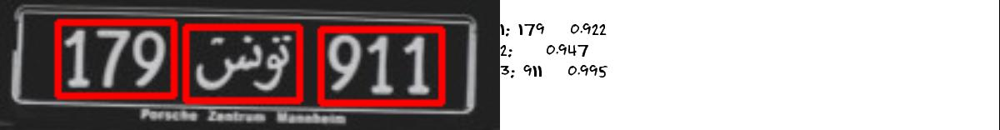

In [122]:
img = cv2.imread('/content/result.jpg', cv2.IMREAD_UNCHANGED)
cv2_imshow(img)